In [910]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as 
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [911]:
df = pd.read_csv('D:\Education\datasets\powerconsumption\powerconsumption.csv', sep = ',', low_memory = False)

In [912]:
df.Datetime = pd.to_datetime(df.Datetime, dayfirst = False, yearfirst = False)

In [913]:
df['Day_of_week'] = df.Datetime.dt.day_of_week
df['Date'] = df.Datetime.dt.date
df['Time'] = df.Datetime.dt.time
df['Hour'] = df.Datetime.dt.hour
df['Day_of_month'] = df.Datetime.dt.day
df['Day_of_year'] = df.Datetime.dt.day_of_year

In [915]:
df_hour = df.groupby(['Date', 'Hour', 'Day_of_week', 'Day_of_month', 'Day_of_year']).agg({
    'Temperature' : 'mean',
    'Humidity' : 'mean', 
    'WindSpeed' : 'mean',
    'GeneralDiffuseFlows' : 'mean',
    'DiffuseFlows' : 'mean',
    'PowerConsumption_Zone1' : 'mean',
    'PowerConsumption_Zone2' : 'mean', 
    'PowerConsumption_Zone3' : 'mean'
    
}).reset_index()

In [916]:
df_daily = df.groupby(['Day_of_year', 'Day_of_week']).agg({
    'Temperature' : 'mean',
    'Humidity' : 'mean', 
    'WindSpeed' : 'mean',
    'GeneralDiffuseFlows' : 'mean',
    'DiffuseFlows' : 'mean',
    'PowerConsumption_Zone1' : 'mean',
    'PowerConsumption_Zone2' : 'mean', 
    'PowerConsumption_Zone3' : 'mean'
    
}).reset_index()

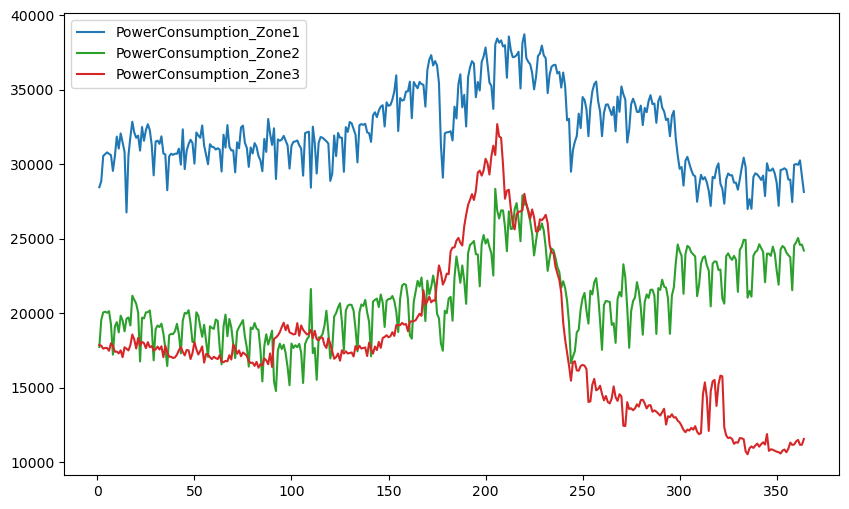

In [918]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df_daily.Day_of_year, 
        df_daily.PowerConsumption_Zone1,
       color = 'tab:blue',
       label = 'PowerConsumption_Zone1')

ax.plot(df_daily.Day_of_year, 
        df_daily.PowerConsumption_Zone2,
       color = 'tab:green',
       label = 'PowerConsumption_Zone2')

ax.plot(df_daily.Day_of_year, 
        df_daily.PowerConsumption_Zone3,
       color = 'tab:red',
       label = 'PowerConsumption_Zone3')

ax.legend()

plt.show()

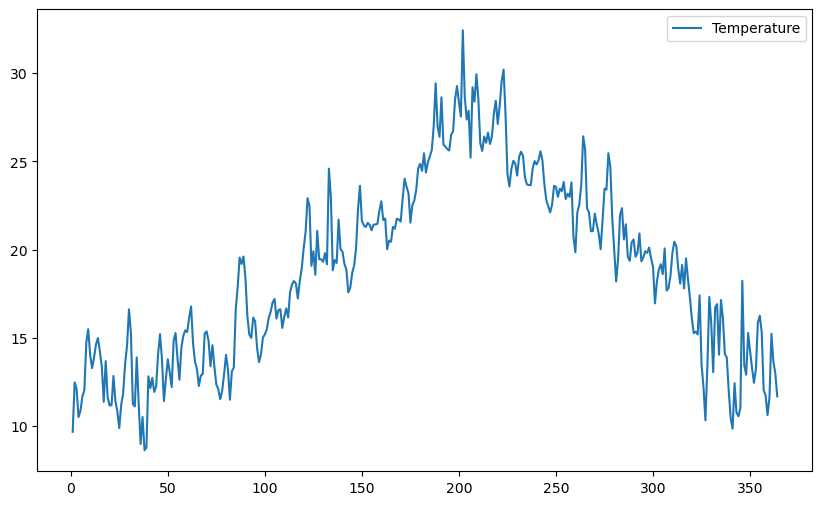

In [919]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df_daily.Day_of_year, 
        df_daily.Temperature,
       color = 'tab:blue',
       label = 'Temperature')

ax.legend()

plt.show()

In [920]:
df_daily.columns

Index(['Day_of_year', 'Day_of_week', 'Temperature', 'Humidity', 'WindSpeed',
       'GeneralDiffuseFlows', 'DiffuseFlows', 'PowerConsumption_Zone1',
       'PowerConsumption_Zone2', 'PowerConsumption_Zone3'],
      dtype='object')

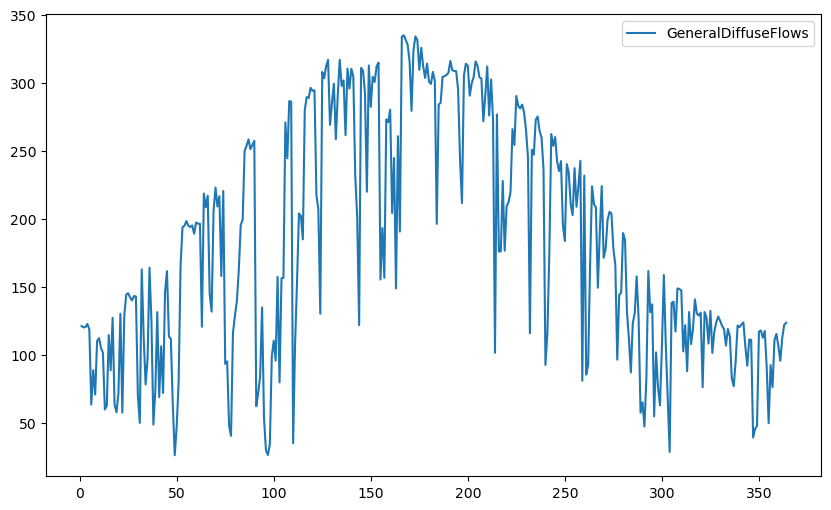

In [921]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df_daily.Day_of_year, 
        df_daily.GeneralDiffuseFlows,
       color = 'tab:blue',
       label = 'GeneralDiffuseFlows')

ax.legend()

plt.show()

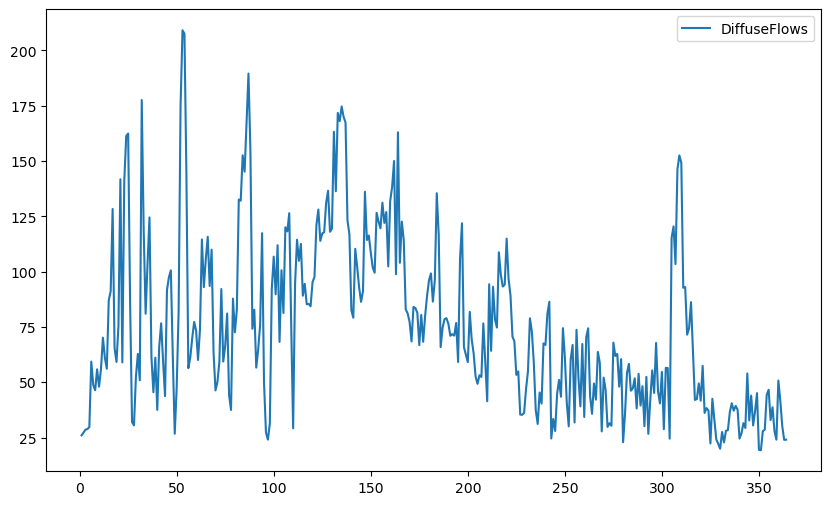

In [922]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df_daily.Day_of_year, 
        df_daily.DiffuseFlows,
       color = 'tab:blue',
       label = 'DiffuseFlows')

ax.legend()

plt.show()

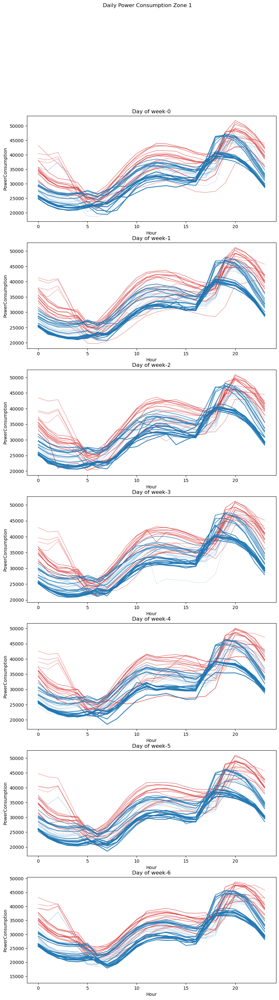

In [923]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily Power Consumption Zone 1')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.PowerConsumption_Zone1.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('PowerConsumption')   


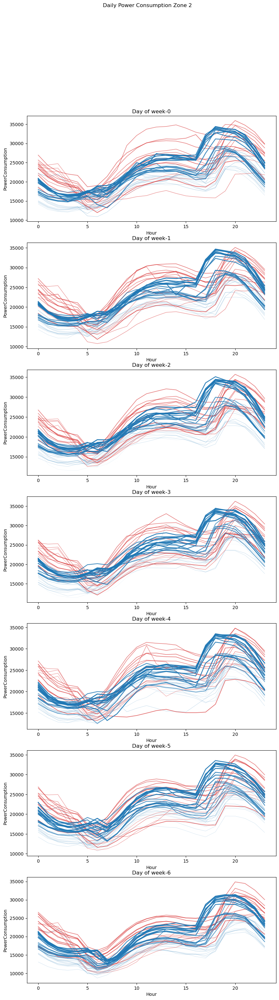

In [924]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily Power Consumption Zone 2')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.PowerConsumption_Zone2.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('PowerConsumption')   


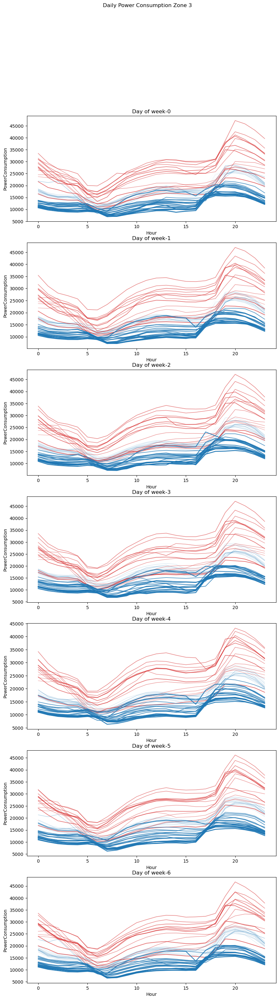

In [925]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily Power Consumption Zone 3')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.PowerConsumption_Zone3.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('PowerConsumption')   


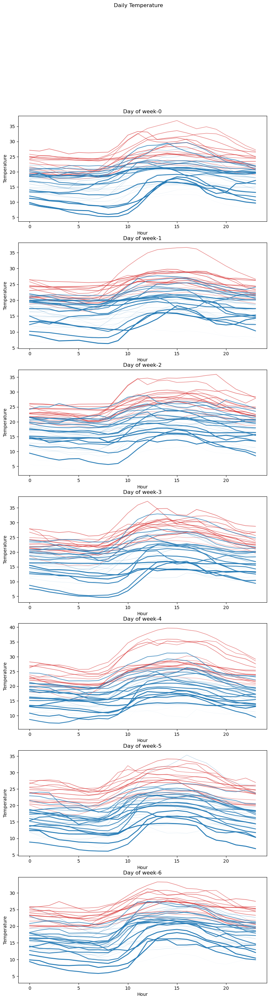

In [926]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily Temperature')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.Temperature.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('Temperature')   


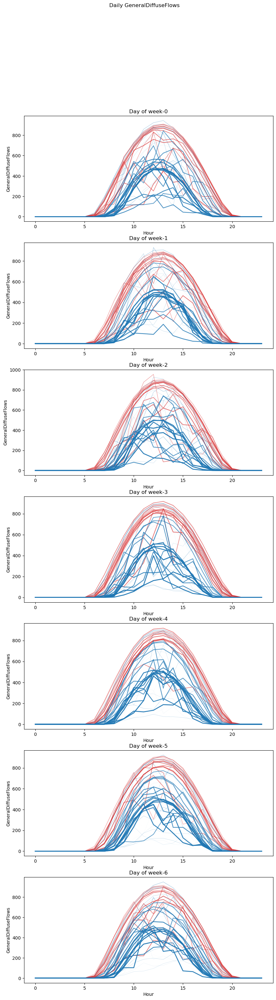

In [927]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily GeneralDiffuseFlows')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.GeneralDiffuseFlows.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('GeneralDiffuseFlows')   


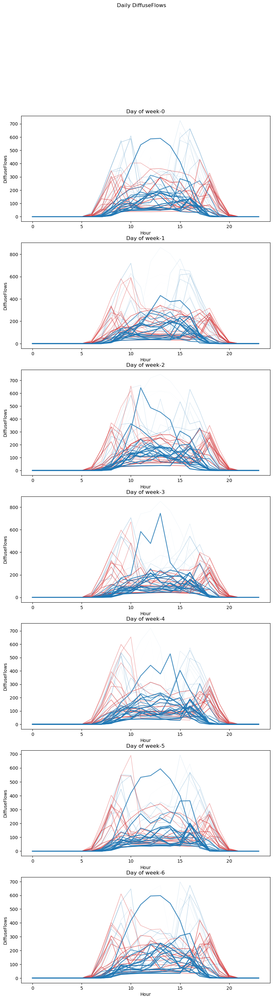

In [928]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily DiffuseFlows')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.DiffuseFlows.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('DiffuseFlows')   


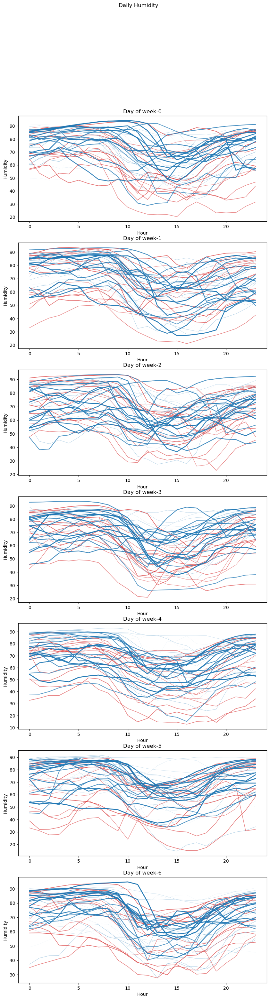

In [929]:
fig, axs = plt.subplots(7, figsize=(10, 35))

fig.suptitle('Daily Humidity')


for day_of_week in df_hour.Day_of_week.unique():
    
    alpha = 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)
    linewidth = 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    for day in df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique():
        
        if (day >= 150) & (day <= 250):
            color = 'tab:red'
        else:
            color = 'tab:blue'
            
        axs[day_of_week].plot(
            df_hour.Hour.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)], 
            df_hour.Humidity.loc[(df_hour.Day_of_week == day_of_week) & (df_hour.Day_of_year == day)],
            color = color,
            label = day,
            linewidth = linewidth,
            alpha = alpha
        )

        alpha = alpha + 1 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) + 1)
        linewidth = linewidth + 2 / (len(df_hour.Day_of_year.loc[df_hour.Day_of_week == day_of_week].unique()) - 1)

    axs[day_of_week].set_title('Day of week' + '-' + str(day_of_week))
    axs[day_of_week].set_xlabel('Hour')
    axs[day_of_week].set_ylabel('Humidity')   


<Axes: >

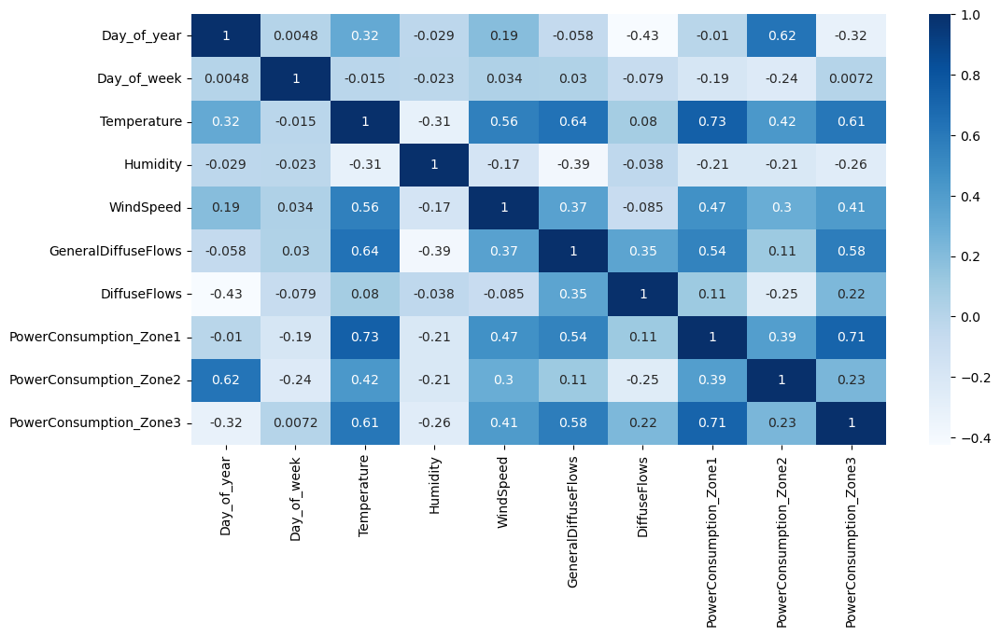

In [930]:
plt.figure(figsize = (12,6))
corr = df_daily.corr()
sns.heatmap(corr, cmap="Blues", annot=True)

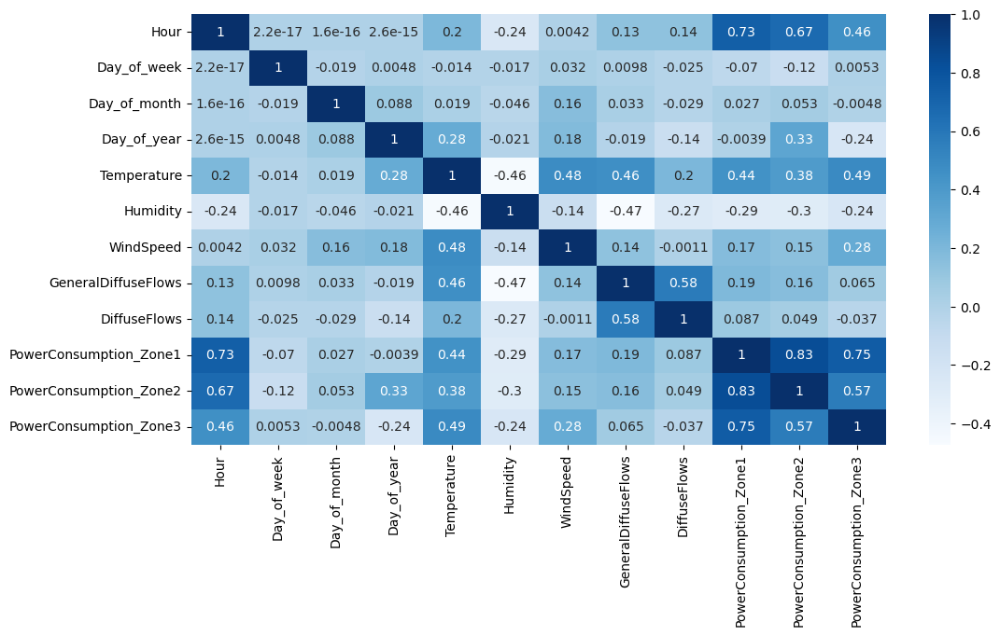

In [931]:
corr = df_hour[['Hour', 'Day_of_week', 'Day_of_month', 'Day_of_year',
       'Temperature', 'Humidity', 'WindSpeed', 'GeneralDiffuseFlows',
       'DiffuseFlows', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2',
       'PowerConsumption_Zone3']].corr()
plt.figure(figsize = (12,6))
ax = sns.heatmap(corr, cmap="Blues", annot = True)


# Zone #1

In [1067]:
df_hour_z1 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'PowerConsumption_Zone1']].loc[df_hour.Day_of_year < 250]
df_hour_z1_2 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'PowerConsumption_Zone1']].loc[df_hour.Day_of_year >= 250]

df_hour_z1['Hour'] = df_hour_z1['Hour'].astype('str')
df_hour_z1['Day_of_week'] = df_hour_z1['Day_of_week'].astype('str')

df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1068]:
X_train, X_test, y_train, y_test = train_test_split(df_hour_z1[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6']], df_hour_z1['PowerConsumption_Zone1'], test_size = 0.2, random_state = 17)

In [1069]:
reg = linear_model.RidgeCV(cv = 50)

reg.fit(X_train, y_train)

RidgeCV(cv=50)

In [1070]:
y_predict = reg.predict(X_test)

In [1071]:
mean_squared_error(y_test, y_predict)

8735830.063517505

In [1072]:
r2_score(y_test, y_predict)

0.8298325584890247

In [1073]:
df_res = pd.DataFrame({'Y_test' : np.array(y_test), 'Y_predict' : y_predict, 'RES' : np.array(y_test) - y_predict})

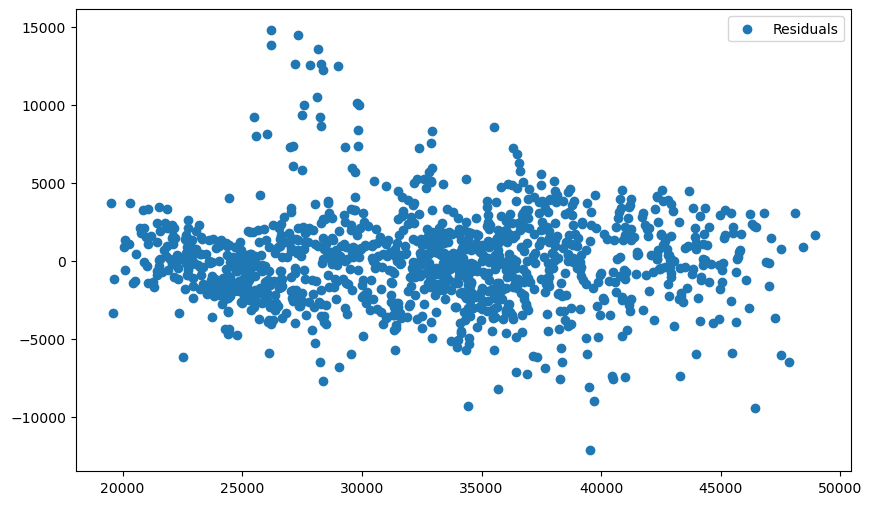

In [1074]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_res.Y_predict,
    df_res.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1075]:
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1076]:
y_predict = reg.predict(df_hour_z1_2[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6']])

In [1077]:
df_hour_z1_2['y_predict'] = y_predict

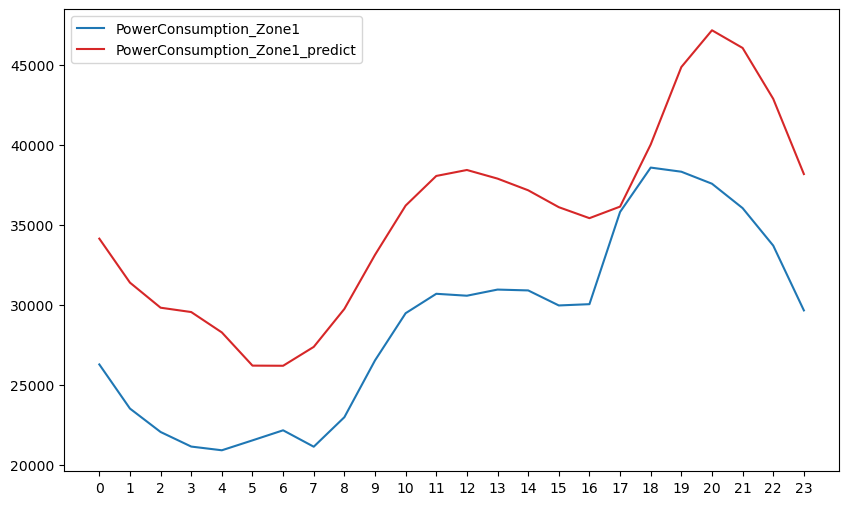

In [1078]:
fig, ax = plt.subplots(figsize=(10, 6))

day_of_year = '350'

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == day_of_year], 
    df_hour_z1_2.PowerConsumption_Zone1.loc[df_hour.Day_of_year.astype('str') == day_of_year],
    color = 'tab:blue',
    label = 'PowerConsumption_Zone1')

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == date], 
    df_hour_z1_2.y_predict.loc[df_hour.Day_of_year.astype('str') == date],
    color = 'tab:red',
    label = 'PowerConsumption_Zone1_predict')

ax.legend()

plt.show()

In [1079]:
df_hour_z1_2['RES'] = df_hour_z1_2.PowerConsumption_Zone1 - df_hour_z1_2.y_predict

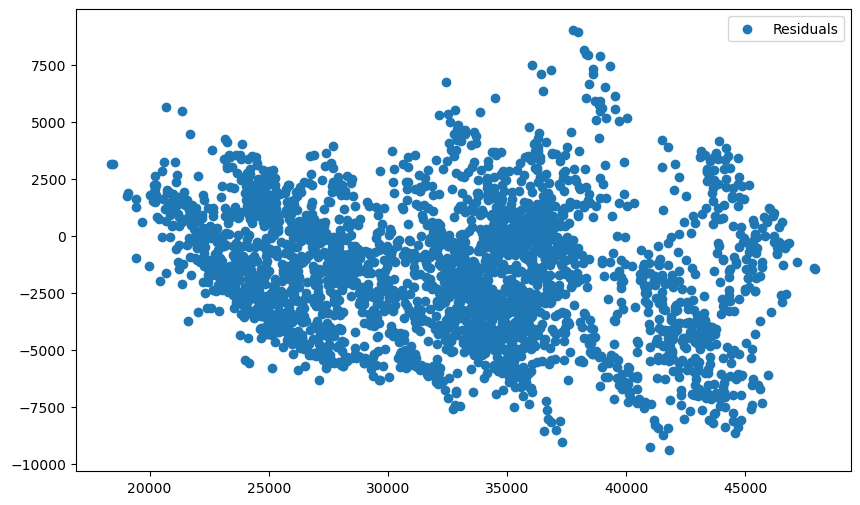

In [1080]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_hour_z1_2.y_predict,
    df_hour_z1_2.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1081]:
mean_squared_error(df_hour_z1_2.PowerConsumption_Zone1, df_hour_z1_2.y_predict)

10619504.351794621

In [1082]:
r2_score(df_hour_z1_2.PowerConsumption_Zone1, df_hour_z1_2.y_predict)

0.7532717225940718

# Зона #3

In [1160]:
df_hour_z1 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'WindSpeed', 'Humidity', 'GeneralDiffuseFlows', 'PowerConsumption_Zone3']].loc[df_hour.Day_of_year < 250]
df_hour_z1_2 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'WindSpeed', 'Humidity','GeneralDiffuseFlows', 'PowerConsumption_Zone3']].loc[df_hour.Day_of_year >= 250]

df_hour_z1['Hour'] = df_hour_z1['Hour'].astype('str')
df_hour_z1['Day_of_week'] = df_hour_z1['Day_of_week'].astype('str')

df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1178]:
X_train, X_test, y_train, y_test = train_test_split(df_hour_z1[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6', 'WindSpeed', 'Humidity', 'GeneralDiffuseFlows']], df_hour_z1['PowerConsumption_Zone3'], test_size = 0.2, random_state = 17)

In [1179]:
reg = linear_model.RidgeCV(cv = 50)

reg.fit(X_train, y_train)

RidgeCV(cv=50)

In [1180]:
y_predict = reg.predict(X_test)

In [1181]:
mean_squared_error(y_test, y_predict)

9272879.945619084

In [1182]:
r2_score(y_test, y_predict)

0.7681614023489682

In [1183]:
df_res = pd.DataFrame({'Y_test' : np.array(y_test), 'Y_predict' : y_predict, 'RES' : np.array(y_test) - y_predict})

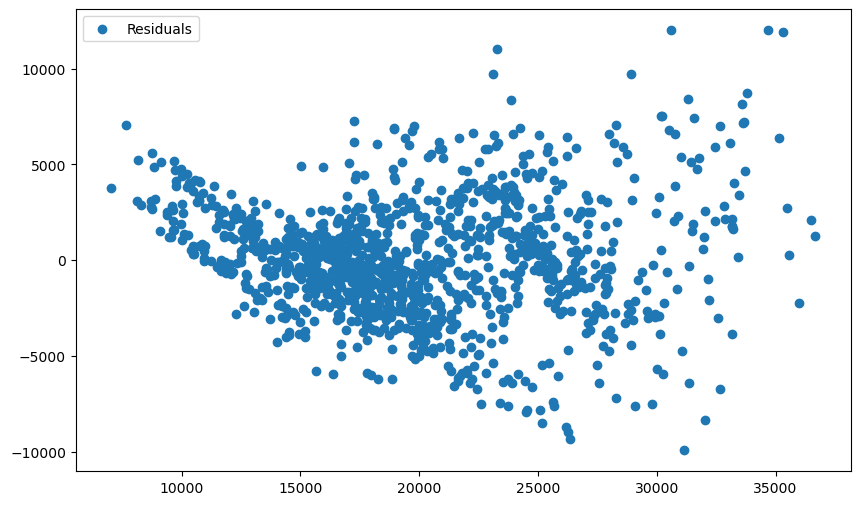

In [1185]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_res.Y_predict,
    df_res.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1186]:
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1187]:
y_predict = reg.predict(df_hour_z1_2[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6', 'WindSpeed', 'Humidity', 'GeneralDiffuseFlows']])

In [1188]:
df_hour_z1_2['y_predict'] = y_predict

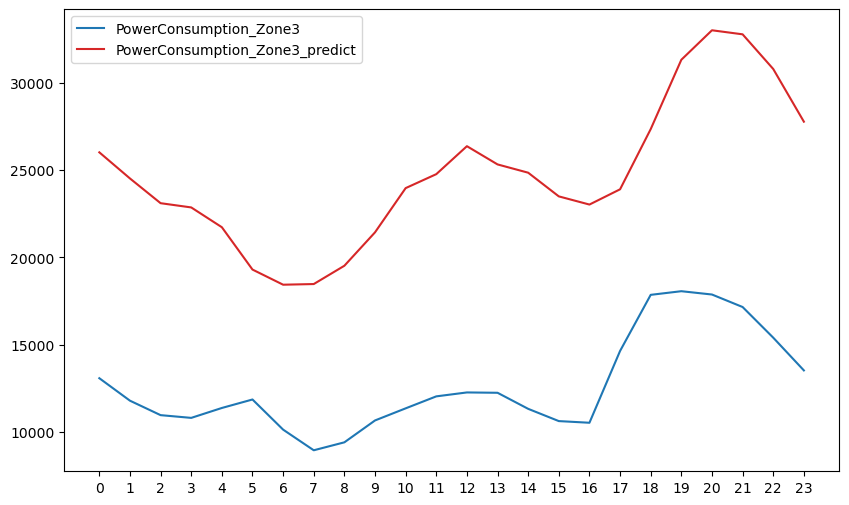

In [1189]:
fig, ax = plt.subplots(figsize=(10, 6))

day_of_year = '300'

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == day_of_year], 
    df_hour_z1_2.PowerConsumption_Zone3.loc[df_hour.Day_of_year.astype('str') == day_of_year],
    color = 'tab:blue',
    label = 'PowerConsumption_Zone3')

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == date], 
    df_hour_z1_2.y_predict.loc[df_hour.Day_of_year.astype('str') == date],
    color = 'tab:red',
    label = 'PowerConsumption_Zone3_predict')

ax.legend()

plt.show()

In [1190]:
df_hour_z1_2['RES'] = df_hour_z1_2.PowerConsumption_Zone3 - df_hour_z1_2.y_predict

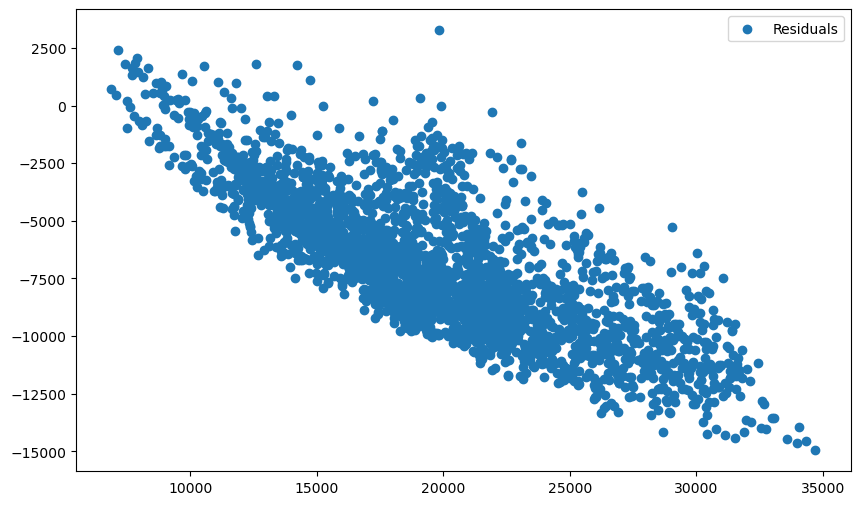

In [1191]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_hour_z1_2.y_predict,
    df_hour_z1_2.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1192]:
mean_squared_error(df_hour_z1_2.PowerConsumption_Zone3, df_hour_z1_2.y_predict)

57695088.29023626

In [1193]:
r2_score(df_hour_z1_2.PowerConsumption_Zone3, df_hour_z1_2.y_predict)

-4.014278089195954

# Зона #2

In [1241]:
df_hour_z1 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'Humidity', 'PowerConsumption_Zone2']].loc[df_hour.Day_of_year < 250]
df_hour_z1_2 = df_hour[['Day_of_week', 'Hour', 'Temperature', 'Humidity','PowerConsumption_Zone2']].loc[df_hour.Day_of_year >= 250]

df_hour_z1['Hour'] = df_hour_z1['Hour'].astype('str')
df_hour_z1['Day_of_week'] = df_hour_z1['Day_of_week'].astype('str')

df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1 = pd.concat([df_hour_z1, pd.get_dummies(df_hour_z1['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1242]:
X_train, X_test, y_train, y_test = train_test_split(df_hour_z1[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6', 'Humidity']], df_hour_z1['PowerConsumption_Zone2'], test_size = 0.2, random_state = 17)

In [1243]:
reg = linear_model.RidgeCV(cv = 50)

reg.fit(X_train, y_train)

RidgeCV(cv=50)

In [1244]:
y_predict = reg.predict(X_test)

In [1245]:
mean_squared_error(y_test, y_predict)

6299099.13024363

In [1246]:
r2_score(y_test, y_predict)

0.7543069801887068

In [1247]:
df_res = pd.DataFrame({'Y_test' : np.array(y_test), 'Y_predict' : y_predict, 'RES' : np.array(y_test) - y_predict})

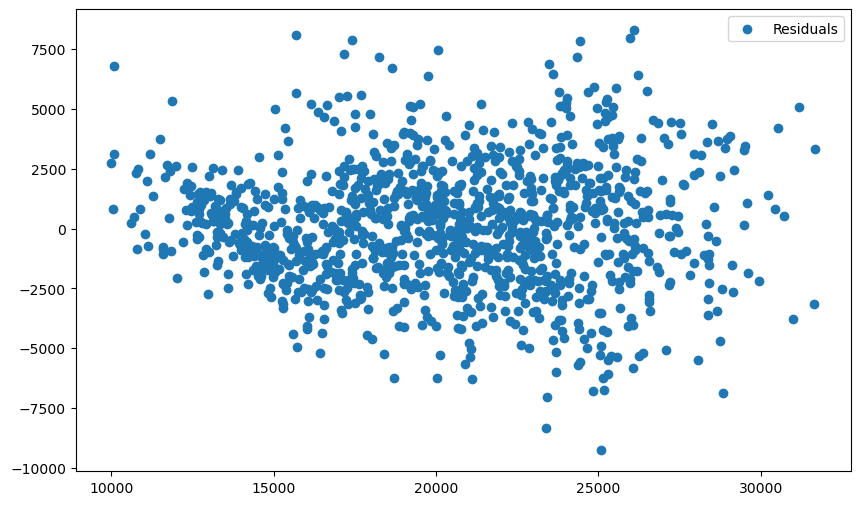

In [1248]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_res.Y_predict,
    df_res.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1249]:
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Hour'], prefix = 'hour', dtype= int)], axis = 1)
df_hour_z1_2 = pd.concat([df_hour_z1_2, pd.get_dummies(df_hour_z1_2['Day_of_week'], prefix = 'day_of_week', dtype= int)], axis = 1)

In [1250]:
y_predict = reg.predict(df_hour_z1_2[['Temperature', 'hour_0', 'hour_1', 'hour_10',
       'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16',
       'hour_17', 'hour_18', 'hour_19', 'hour_2', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6', 'Humidity']])

In [1251]:
df_hour_z1_2['y_predict'] = y_predict

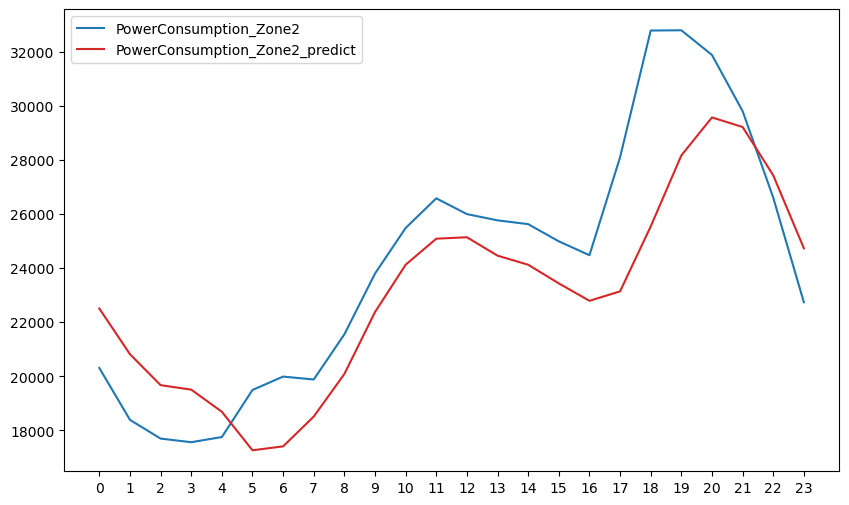

In [1252]:
fig, ax = plt.subplots(figsize=(10, 6))

day_of_year = '300'

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == day_of_year], 
    df_hour_z1_2.PowerConsumption_Zone2.loc[df_hour.Day_of_year.astype('str') == day_of_year],
    color = 'tab:blue',
    label = 'PowerConsumption_Zone2')

ax.plot(
    df_hour_z1_2.Hour.loc[df_hour.Day_of_year.astype('str') == date], 
    df_hour_z1_2.y_predict.loc[df_hour.Day_of_year.astype('str') == date],
    color = 'tab:red',
    label = 'PowerConsumption_Zone2_predict')

ax.legend()

plt.show()

In [1253]:
df_hour_z1_2['RES'] = df_hour_z1_2.PowerConsumption_Zone2 - df_hour_z1_2.y_predict

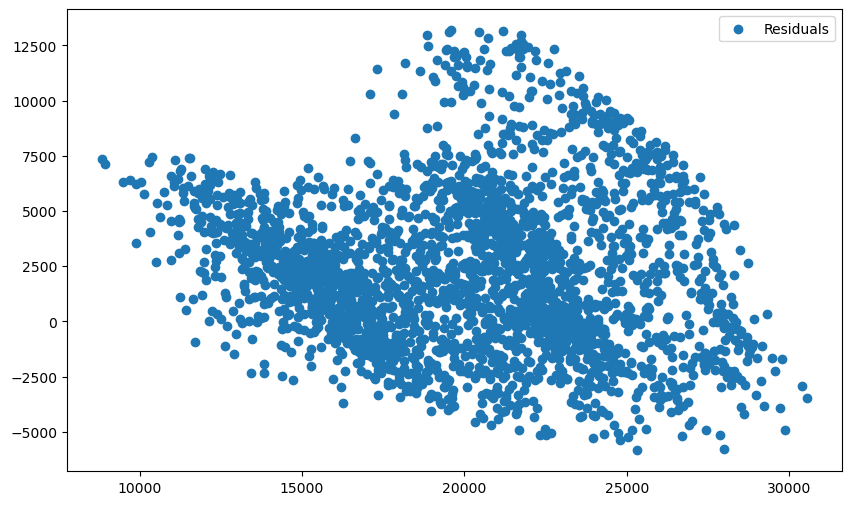

In [1254]:
fig, ax = plt.subplots(figsize=(10, 6))


ax.scatter(
    df_hour_z1_2.y_predict,
    df_hour_z1_2.RES,
    color = 'tab:blue',
    label = 'Residuals')


ax.legend()

plt.show()

In [1255]:
mean_squared_error(df_hour_z1_2.PowerConsumption_Zone2, df_hour_z1_2.y_predict)

17024164.24790067

In [1256]:
r2_score(df_hour_z1_2.PowerConsumption_Zone2, df_hour_z1_2.y_predict)

0.36014579720012274